# Vision Transformer (ViT) Image Classification Testing

This notebook uses a trained Vision Transformer (ViT-B-16) model to classify unlabeled images from the Intel Image Dataset.

**Classes**: buildings, forest, glacier, mountain, sea, street

**Input**: Images in `dataset/seg_pred/seg_pred/`
**Model**: `checkpoints_vit/best_model.pth`
**Output**: 
- CSV file with predictions and confidence scores
- Visualization of class distribution and confidence scores
- Grid display of sample predictions

In [1]:
import os
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import models, transforms
from PIL import Image
import logging
import random
import matplotlib.pyplot as plt
import numpy as np
from datetime import datetime

# Setup logging with both file and console handlers
logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(levelname)s - %(message)s')

## Dataset Class
Define a custom dataset class for loading unlabeled images

In [2]:
class UnlabeledIntelDataset(Dataset):
    def __init__(self, root, transform=None, num_samples=None, seed=42):
        self.root = root
        self.transform = transform
        all_images = [f for f in os.listdir(root) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
        
        if num_samples and num_samples < len(all_images):
            random.seed(seed)
            self.images = random.sample(all_images, num_samples)
        else:
            self.images = all_images
            
        logging.info(f"Found {len(self.images)} images in {root}")

    def __getitem__(self, index):
        img_name = self.images[index]
        img_path = os.path.join(self.root, img_name)
        try:
            img = Image.open(img_path).convert('RGB')
        except Exception as e:
            logging.error(f"Error loading image {img_path}: {e}")
            return None, img_name
        if self.transform is not None:
            img = self.transform(img)
        return img, img_name

    def __len__(self):
        return len(self.images)

## Model and Data Loader Setup
Initialize the ViT model and data loader

In [3]:
def setup_model_and_loader(pred_dir, checkpoint_path, batch_size=8, num_samples=100):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    logging.info(f"Using device: {device}")

    # Define transform (same as training)
    transform = transforms.Compose([
        transforms.Resize((224, 224)),  # ViT-B-16 default size
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])

    # Load dataset with random sampling
    dataset = UnlabeledIntelDataset(pred_dir, transform=transform, num_samples=num_samples)
    loader = DataLoader(
        dataset,
        batch_size=batch_size,
        shuffle=False,
        num_workers=0,  # Use single process loading for stability
        pin_memory=torch.cuda.is_available()
    )

    # Load model
    model = models.vit_b_16(weights=None)
    # Replace classifier
    model.heads.head = torch.nn.Linear(model.heads.head.in_features, 6)
    checkpoint = torch.load(checkpoint_path, map_location=device)
    model.load_state_dict(checkpoint['model_state_dict'])
    model = model.to(device)
    model.eval()

    return model, loader, device

## Image Classification Function
Function to process images and get predictions

In [4]:
def classify_images(model, loader, device):
    classes = ['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']
    predictions = []
    total_images = len(loader.dataset)
    processed = 0
    
    logging.info(f"Starting classification of {total_images} images...")
    model.eval()

    with torch.no_grad():
        for batch_idx, (images, img_names) in enumerate(loader):
            # Skip None images
            valid_indices = [i for i, img in enumerate(images) if img is not None]
            if not valid_indices:
                continue
                
            try:
                valid_images = torch.stack([images[i] for i in valid_indices]).to(device)
                valid_names = [img_names[i] for i in valid_indices]

                outputs = model(valid_images)
                probabilities = torch.nn.functional.softmax(outputs, dim=1)
                confidences, predicted = torch.max(probabilities, 1)
                
                for img_name, pred_idx, conf in zip(valid_names, predicted, confidences):
                    pred_class = classes[pred_idx.item()]
                    confidence = conf.item() * 100
                    predictions.append((img_name, pred_class, confidence))
                    processed += 1
                    
                    if processed % 10 == 0:
                        logging.info(f"Progress: {processed}/{total_images} images ({processed/total_images*100:.1f}%)")
                        logging.info(f"Latest: {img_name} -> {pred_class} ({confidence:.1f}%)")
                    
            except Exception as e:
                logging.error(f"Error processing batch {batch_idx}: {str(e)}")
                continue

    logging.info(f"Classification completed. Successfully processed {len(predictions)} images.")
    return predictions

## Visualization Function
Function to display predictions in a grid

In [5]:
def show_predictions(pred_dir, predictions, num_images=None):
    if num_images is None:
        num_images = len(predictions)
    
    # Calculate grid size
    n_cols = 5
    n_rows = (num_images + n_cols - 1) // n_cols
    plt.figure(figsize=(20, 4*n_rows))
    
    # Sort by confidence if confidence is available
    if len(predictions[0]) == 3:
        # Sort by confidence in descending order
        sorted_preds = sorted(predictions, key=lambda x: x[2], reverse=True)
    else:
        sorted_preds = predictions
        
    for idx, pred in enumerate(sorted_preds[:num_images]):
        img_name = pred[0]
        pred_class = pred[1]
        confidence = f"{pred[2]:.1f}%" if len(pred) == 3 else "N/A"
        
        # Load and display image
        img_path = os.path.join(pred_dir, img_name)
        img = Image.open(img_path).convert('RGB')
        
        plt.subplot(n_rows, n_cols, idx+1)
        plt.imshow(img)
        plt.title(f"{pred_class}\n{confidence}", pad=10)
        plt.axis('off')
    
    plt.tight_layout()
    plt.show()

## Run Classification and Generate Results

2025-04-27 21:17:02,381 - INFO - Using checkpoint: checkpoints_vit/best_model.pth
2025-04-27 21:17:02,470 - INFO - Using device: cuda
2025-04-27 21:17:02,470 - INFO - Using device: cuda
2025-04-27 21:17:02,515 - INFO - Found 7301 images in dataset/seg_pred/seg_pred_modified
2025-04-27 21:17:02,515 - INFO - Found 7301 images in dataset/seg_pred/seg_pred_modified
2025-04-27 21:17:04,785 - INFO - Starting classification of 7301 images...
2025-04-27 21:17:04,785 - INFO - Starting classification of 7301 images...
2025-04-27 21:17:05,808 - INFO - Progress: 10/7301 images (0.1%)
2025-04-27 21:17:05,810 - INFO - Latest: 10040_low_-0.5.jpg -> street (82.3%)
2025-04-27 21:17:05,808 - INFO - Progress: 10/7301 images (0.1%)
2025-04-27 21:17:05,810 - INFO - Latest: 10040_low_-0.5.jpg -> street (82.3%)
2025-04-27 21:17:06,001 - INFO - Progress: 20/7301 images (0.3%)
2025-04-27 21:17:06,002 - INFO - Latest: 10069_bright_0.9.jpg -> sea (89.0%)
2025-04-27 21:17:06,001 - INFO - Progress: 20/7301 images 

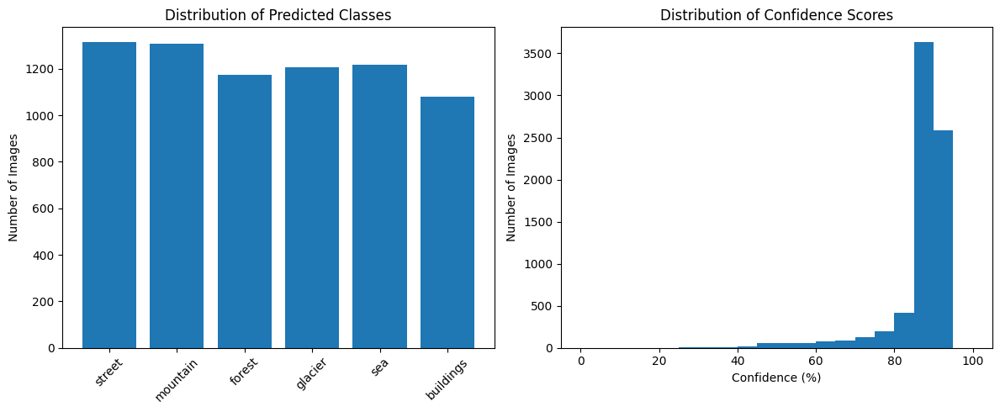

2025-04-27 21:19:47,835 - INFO - Displaying random 100 predictions...


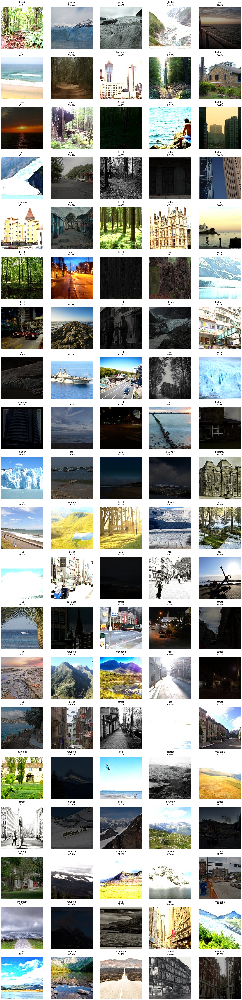

In [6]:
# Configuration
pred_dir = 'dataset/seg_pred/seg_pred_modified'
checkpoint_path = 'checkpoints_vit/best_model.pth'
num_samples = None  # Number of random images to classify

# Create a unique log file for this run
log_file = f'classification_log_{datetime.now().strftime("%Y%m%d_%H%M%S")}.txt'
file_handler = logging.FileHandler(log_file)
file_handler.setFormatter(logging.Formatter('%(asctime)s - %(levelname)s - %(message)s'))
logging.getLogger().addHandler(file_handler)

try:
    if not os.path.exists(pred_dir):
        raise FileNotFoundError(f"Prediction directory {pred_dir} not found.")
    if not os.path.exists(checkpoint_path):
        raise FileNotFoundError(f"Checkpoint {checkpoint_path} not found.")

    logging.info(f"Using checkpoint: {checkpoint_path}")
    model, loader, device = setup_model_and_loader(pred_dir, checkpoint_path, num_samples=num_samples)
    predictions = classify_images(model, loader, device)
    logging.info(f"Successfully classified {len(predictions)} images.")

    # Save predictions to a file
    output_file = 'predictions_vit.csv'
    with open(output_file, 'w') as f:
        f.write("image_name,predicted_class,confidence\n")
        for pred in predictions:
            if len(pred) == 3:
                img_name, pred_class, confidence = pred
                f.write(f"{img_name},{pred_class},{confidence:.2f}\n")
            else:
                img_name, pred_class = pred
                f.write(f"{img_name},{pred_class},NA\n")
    logging.info(f"Predictions saved to {output_file}")

    # Display class distribution
    class_counts = {}
    for pred in predictions:
        pred_class = pred[1]
        class_counts[pred_class] = class_counts.get(pred_class, 0) + 1

    plt.figure(figsize=(12, 5))
    plt.subplot(1, 2, 1)
    classes = list(class_counts.keys())
    counts = list(class_counts.values())
    plt.bar(classes, counts)
    plt.title('Distribution of Predicted Classes')
    plt.xticks(rotation=45)
    plt.ylabel('Number of Images')

    # Display confidence distribution
    if len(predictions[0]) == 3:
        confidences = [pred[2] for pred in predictions]
        plt.subplot(1, 2, 2)
        plt.hist(confidences, bins=20, range=(0, 100))
        plt.title('Distribution of Confidence Scores')
        plt.xlabel('Confidence (%)')
        plt.ylabel('Number of Images')
    
    plt.tight_layout()
    plt.show()

    # Show predictions
    logging.info("Displaying random 100 predictions...")
    sample_size = min(100, len(predictions))
    random_predictions = random.sample(predictions, sample_size)
    show_predictions(pred_dir, random_predictions, num_images=100)

except Exception as e:
    logging.error(f"An error occurred: {str(e)}")
    raise